In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [9]:
df = pd.read_csv(r"C:\Users\USER\Documents\AUN\Time-series-analysis---Cereal-price-prediction\notebook\wfp_food_prices_nga.csv")

In [10]:
df

,Date,State,LGA,Local Market Name,latitude,longitude,category,commodity name,unit,priceflag,pricetype,price (NGN),usdprice
0,1/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Maize,KG,actual,Wholesale,175.92,1.5398
1,1/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Millet,KG,actual,Wholesale,150.18,1.3145
2,1/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Rice (imported),KG,actual,Wholesale,358.70,3.1396
3,1/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Sorghum,KG,actual,Wholesale,155.61,1.3620
4,1/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,pulses and nuts,Beans (niebe),KG,actual,Wholesale,196.87,1.7231
...,...,...,...,...,...,...,...,...,...,...,...,...,...
50944,6/15/2024,Yobe,Yusufari,Yusufari,13.062665,11.171371,oil and fats,Oil (vegetable),L,aggregate,Retail,2000.00,2.5999
50945,6/15/2024,Yobe,Yusufari,Yusufari,13.062665,11.171371,pulses and nuts,Beans (white),2.5 KG,aggregate,Retail,4875.00,6.3373
50946,6/15/2024,Yobe,Yusufari,Yusufari,13.062665,11.171371,pulses and nuts,Groundnuts,2.5 KG,aggregate,Retail,3462.50,4.5011
50947,6/15/2024,Yobe,Yusufari,Yusufari,13.062665,11.171371,vegetables and fruits,Onions,0.5 KG,aggregate,Retail,381.25,0.4956


## Data Inspection

In [11]:
# shape of the data
df.shape

(50949, 13)

In [12]:
df.columns

Index(['Date', 'State', 'LGA', 'Local Market Name', 'latitude', 'longitude',
       'category', 'commodity name', 'unit', 'priceflag', 'pricetype',
       'price (NGN)', 'usdprice'],
      dtype='object')

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50949 entries, 0 to 50948
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Date               50949 non-null  object 
 1   State              50949 non-null  object 
 2   LGA                50949 non-null  object 
 3   Local Market Name  50949 non-null  object 
 4   latitude           50949 non-null  float64
 5   longitude          50949 non-null  float64
 6   category           50949 non-null  object 
 7   commodity name     50949 non-null  object 
 8   unit               50949 non-null  object 
 9   priceflag          50949 non-null  object 
 10  pricetype          50949 non-null  object 
 11  price (NGN)        50949 non-null  float64
 12  usdprice           50949 non-null  float64
dtypes: float64(4), object(9)
memory usage: 5.1+ MB


In [14]:
# Check for duplicates
df.duplicated().sum()

0

In [15]:
df.describe()

,latitude,longitude,price (NGN),usdprice
count,50949.000000,50949.000000,50949.000000,50949.000000
mean,11.448942,10.442549,5458.884536,16.787907
std,1.644317,2.923376,11002.238024,32.203546
min,5.147640,3.401897,1.000000,0.002300
25%,11.280160,8.429120,200.000000,0.619000
50%,11.831100,11.499503,468.580000,1.317500
75%,12.493820,13.123314,4173.910000,18.537700
max,13.645000,13.913103,138000.000000,453.172200


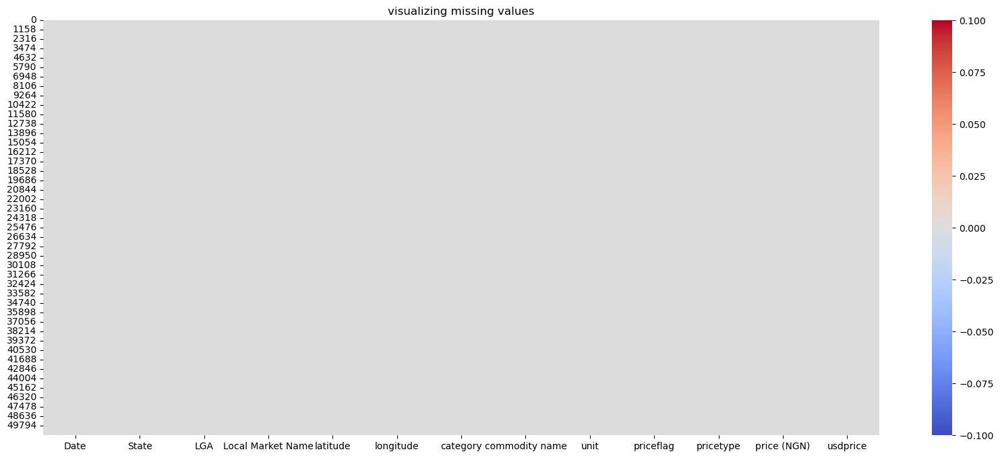

In [16]:
# visualize the missing values
plt.figure(figsize = (20, 8))
plt.title('visualizing missing values')
sns.heatmap(df.isnull(), cbar = True, cmap = 'coolwarm')
plt.show()

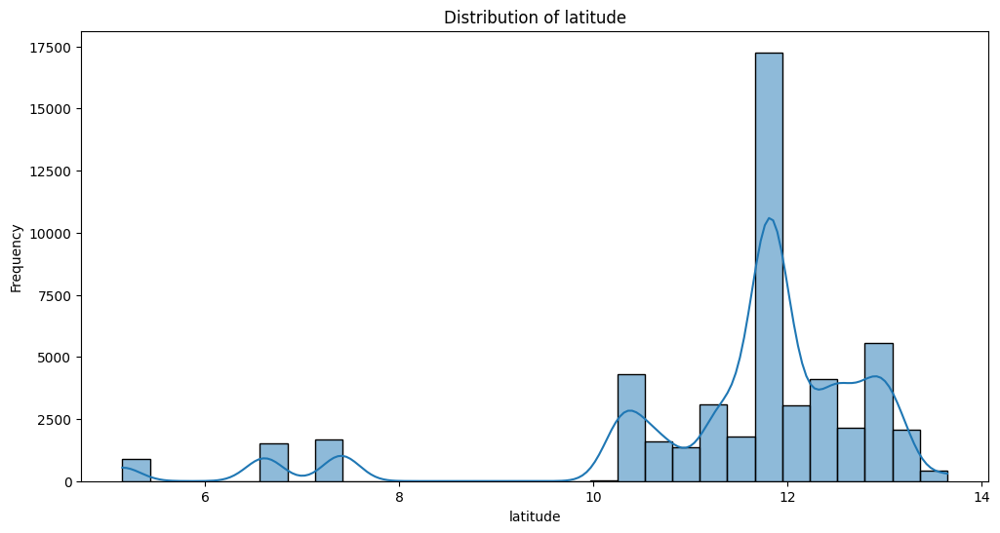

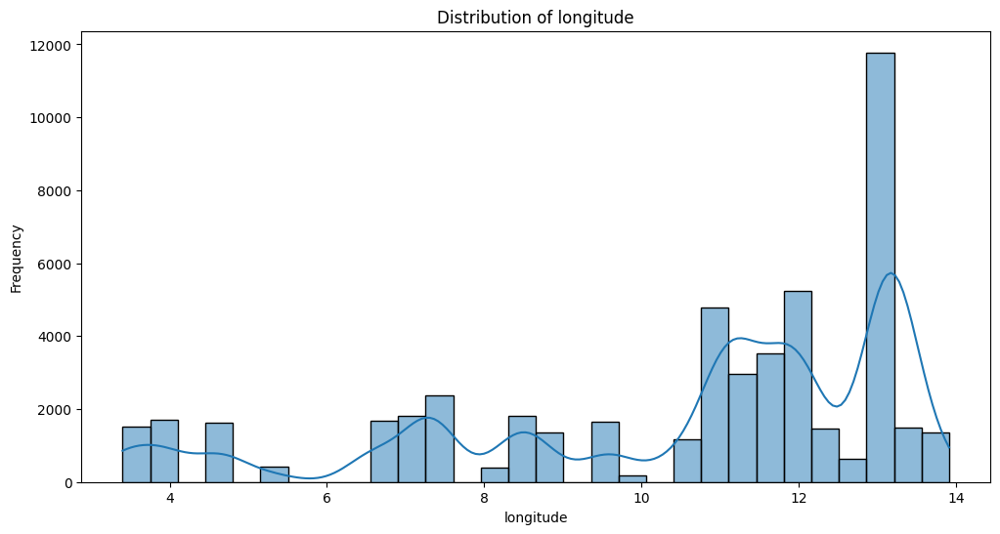

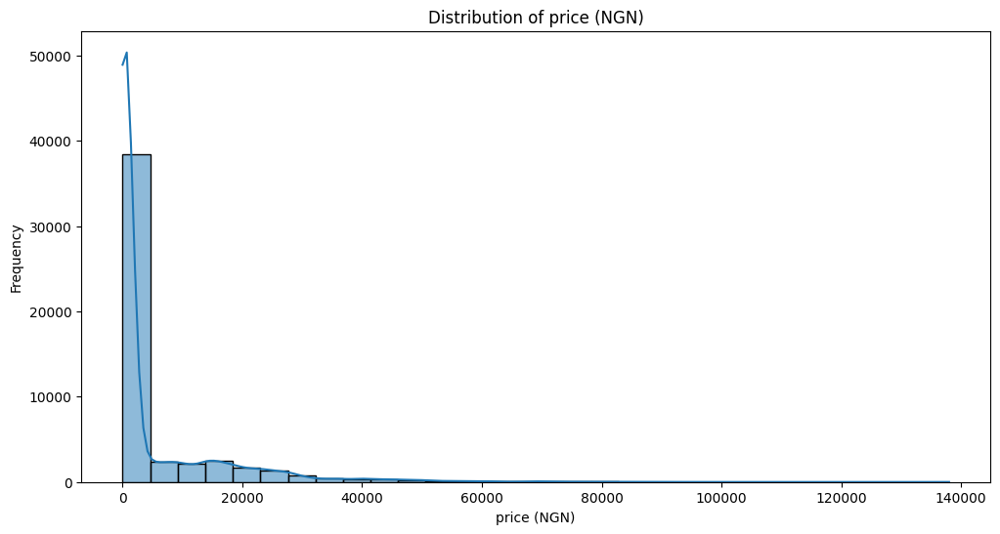

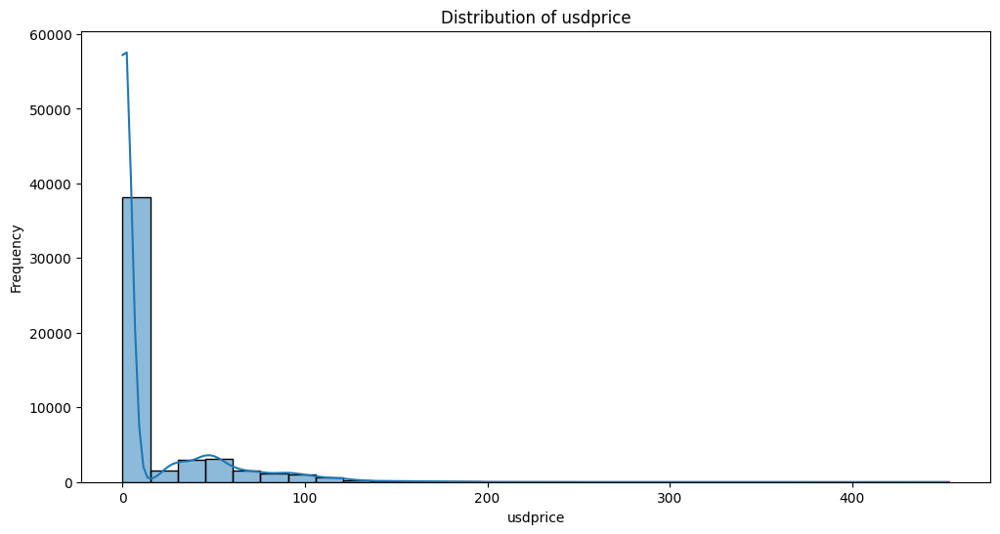

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize the distributions of numerical features
num_cols = [
    'latitude',	'longitude','price (NGN)','usdprice'
]

for feature in num_cols:
    plt.figure(figsize=(12, 6))
    sns.histplot(df[feature], kde=True, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

In [17]:
# Unique values of cereals
df.category.value_counts()

category
cereals and tubers       24159
pulses and nuts           8609
vegetables and fruits     5963
meat, fish and eggs       4226
oil and fats              3025
non-food                  2011
miscellaneous food        1887
milk and dairy            1069
Name: count, dtype: int64

In [18]:
df['commodity name'].value_counts()

commodity name
Millet                         3036
Rice (imported)                2782
Rice (local)                   2585
Yam                            2516
Oil (palm)                     1924
Sorghum (white)                1705
Groundnuts (shelled)           1541
Maize (white)                  1528
Cowpeas (white)                1501
Gari (white)                   1438
Sorghum                        1427
Cowpeas (brown)                1419
Sorghum (brown)                1414
Maize (yellow)                 1413
Cassava meal (gari, yellow)    1297
Bread                          1253
Beans (white)                  1117
Oil (vegetable)                1101
Meat (beef)                    1101
Groundnuts                     1083
Beans (red)                    1080
Milk (powder)                  1069
Fish                           1052
Onions                         1051
Meat (goat)                    1050
Oranges                        1032
Eggs                           1023
Fuel (petrol-

In [20]:
df2 = df.copy()

In [21]:
'''target_commodities = ['Rice (local)','Rice (imported)',
                      'Rice (milled, local)','Millet',
                      'sorghum', 'Maize (white)','Maize (yellow)']
df2 = df2[df2['commodity name'].str.lower().isin(target_commodities)]'''
df_filtered = df2[df2['commodity name'].isin(['Rice (local)','Rice (imported)',
                      'Rice (milled, local)','Millet',
                      'Sorghum', 'Sorghum (white)', 'Sorghum (brown)','Maize (white)','Maize (yellow)'])]

In [22]:
df_filtered['commodity name'].value_counts()

commodity name
Millet                  3036
Rice (imported)         2782
Rice (local)            2585
Sorghum (white)         1705
Maize (white)           1528
Sorghum                 1427
Sorghum (brown)         1414
Maize (yellow)          1413
Rice (milled, local)     228
Name: count, dtype: int64

In [41]:
df_filtered.shape

(16118, 13)

In [42]:
df_filtered.category.value_counts()

,count
category,
cereals and tubers,16118


In [43]:
df_filtered

,Date,State,LGA,Local Market Name,latitude,longitude,category,commodity name,unit,priceflag,pricetype,price (NGN),usdprice
1,1/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Millet,KG,actual,Wholesale,150.18,1.3145
2,1/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Rice (imported),KG,actual,Wholesale,358.70,3.1396
3,1/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Sorghum,KG,actual,Wholesale,155.61,1.3620
5,1/15/2002,Sokoto,Gada,Illela (CBM),13.645000,5.278000,cereals and tubers,Millet,KG,actual,Wholesale,146.95,1.2862
6,1/15/2002,Sokoto,Gada,Illela (CBM),13.645000,5.278000,cereals and tubers,Rice (imported),KG,actual,Wholesale,337.59,2.9549
...,...,...,...,...,...,...,...,...,...,...,...,...,...
50920,6/15/2024,Yobe,Yunusari,Yunusari,13.149834,11.540236,cereals and tubers,Rice (local),2.5 KG,aggregate,Retail,3387.50,4.4036
50921,6/15/2024,Yobe,Yunusari,Yunusari,13.149834,11.540236,cereals and tubers,Sorghum,2.5 KG,aggregate,Retail,1762.50,2.2912
50935,6/15/2024,Yobe,Yusufari,Yusufari,13.062665,11.171371,cereals and tubers,Millet,2.5 KG,aggregate,Retail,2000.00,2.5999
50936,6/15/2024,Yobe,Yusufari,Yusufari,13.062665,11.171371,cereals and tubers,Rice (local),2.5 KG,aggregate,Retail,3325.00,4.3223


<ipython-input-44-50b3eaa4e87b>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='commodity name', y='price (NGN)', data=df_filtered, palette='viridis')
<ipython-input-44-50b3eaa4e87b>:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Commodities', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside the plot


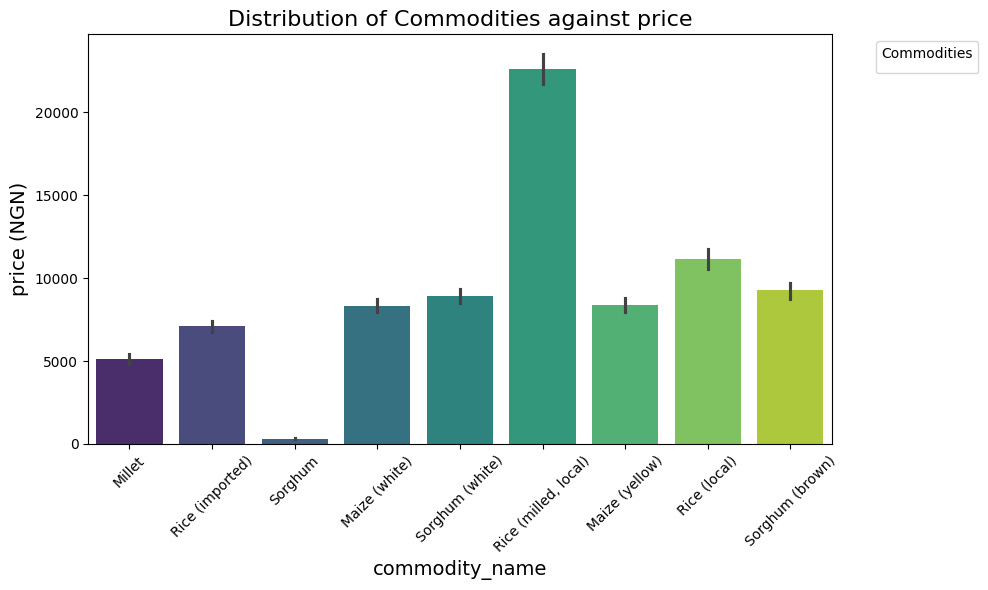

In [44]:
# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='commodity name', y='price (NGN)', data=df_filtered, palette='viridis')

# Customize the plot
plt.title('Distribution of Commodities against price', fontsize=16)
plt.xlabel('commodity_name', fontsize=14)
plt.ylabel('price (NGN)', fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Commodities', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside the plot
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

<ipython-input-45-98242a126de7>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='commodity name', y='price (NGN)', data=df_filtered, palette='viridis')
<ipython-input-45-98242a126de7>:10: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title='Commodities', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside the plot


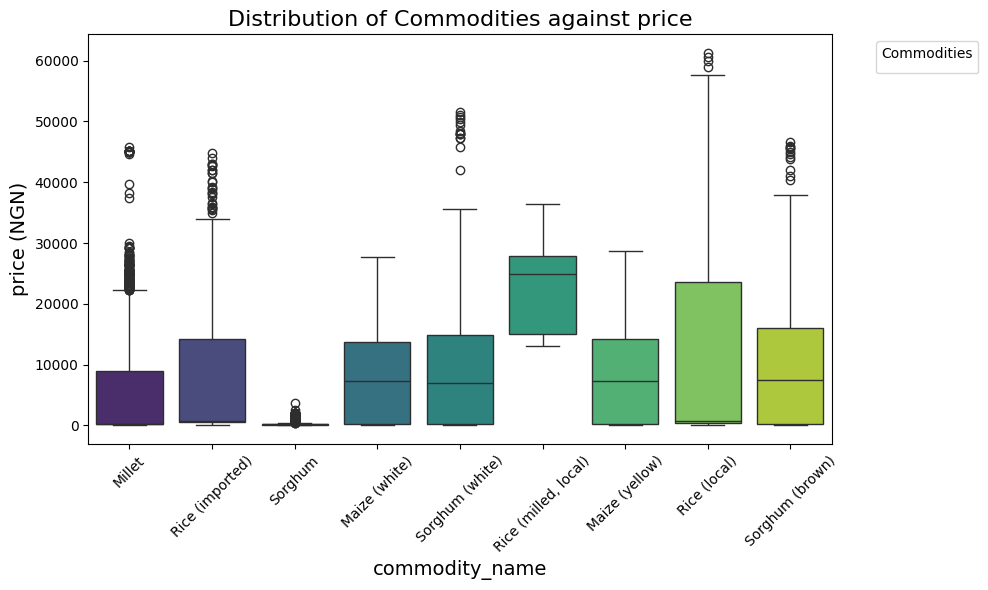

In [45]:
# Plotting
plt.figure(figsize=(10, 6))
sns.boxplot(x='commodity name', y='price (NGN)', data=df_filtered, palette='viridis')

# Customize the plot
plt.title('Distribution of Commodities against price', fontsize=16)
plt.xlabel('commodity_name', fontsize=14)
plt.ylabel('price (NGN)', fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Commodities', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside the plot
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

In [51]:
df_filtered.isna().sum()

,0
Date,0
State,0
LGA,0
Local Market Name,0
latitude,0
longitude,0
category,0
commodity name,0
unit,0
priceflag,0


In [52]:
df_filtered.columns

Index(['Date', 'State', 'LGA', 'Local Market Name', 'latitude', 'longitude',
       'category', 'commodity name', 'unit', 'priceflag', 'pricetype',
       'price (NGN)', 'usdprice'],
      dtype='object')

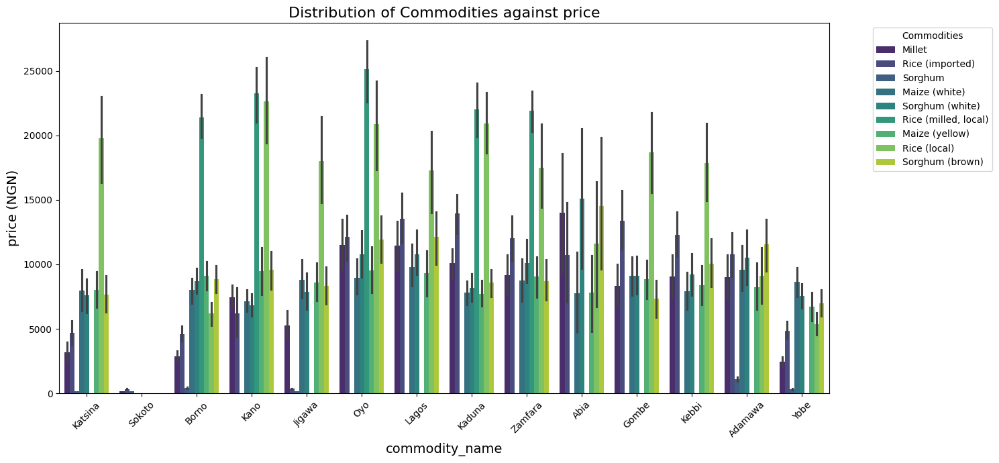

In [61]:
# Plotting
plt.figure(figsize=(15, 7))
sns.barplot(x='State', y='price (NGN)', hue = 'commodity name',data=df_filtered, palette='viridis')

# Customize the plot
plt.title('Distribution of Commodities against price', fontsize=16)
plt.xlabel('commodity_name', fontsize=14)
plt.ylabel('price (NGN)', fontsize=14)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(title='Commodities', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside the plot
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

In [23]:
df_filtered[df_filtered['commodity name'] == 'Millet']

,Date,State,LGA,Local Market Name,latitude,longitude,category,commodity name,unit,priceflag,pricetype,price (NGN),usdprice
1,1/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Millet,KG,actual,Wholesale,150.18,1.3145
5,1/15/2002,Sokoto,Gada,Illela (CBM),13.645000,5.278000,cereals and tubers,Millet,KG,actual,Wholesale,146.95,1.2862
9,2/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Millet,KG,actual,Wholesale,148.54,1.2399
12,3/15/2002,Katsina,Jibia,Jibia (CBM),13.080000,7.240000,cereals and tubers,Millet,KG,actual,Wholesale,175.00,1.4957
15,3/15/2002,Sokoto,Gada,Illela (CBM),13.645000,5.278000,cereals and tubers,Millet,KG,actual,Wholesale,182.36,1.5586
...,...,...,...,...,...,...,...,...,...,...,...,...,...
50830,6/15/2024,Yobe,Gujba,Gujba (Buni Yadi),11.285202,11.999501,cereals and tubers,Millet,2.5 KG,aggregate,Retail,2026.09,2.6338
50880,6/15/2024,Yobe,Machina,Machina Central,12.917630,9.900070,cereals and tubers,Millet,2.5 KG,aggregate,Retail,2262.50,2.9411
50900,6/15/2024,Yobe,Potiskum,Potiskum,11.707240,11.082490,cereals and tubers,Millet,2.5 KG,aggregate,Retail,2093.33,2.7212
50918,6/15/2024,Yobe,Yunusari,Yunusari,13.149834,11.540236,cereals and tubers,Millet,2.5 KG,aggregate,Retail,2000.00,2.5999


/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:718: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.11/dist-packages/seaborn/axisgrid.py:854: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same 

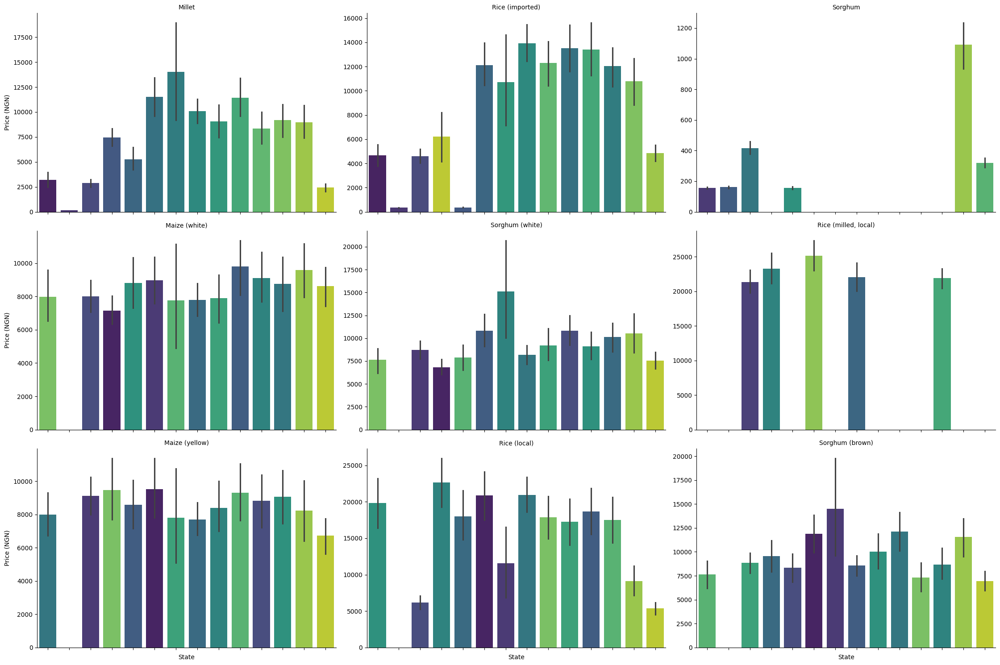

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a FacetGrid for each commodity
g = sns.FacetGrid(df_filtered, col='commodity name', col_wrap=3, height=5, aspect=1.5, sharey=False)

# Map a barplot to each facet
g.map(sns.barplot, 'State', 'price (NGN)', palette='viridis')

# Customize the plot

g.set_axis_labels('State', 'Price (NGN)')
g.set_titles('{col_name}')  # Set the title of each facet to the commodity name
g.set_xticklabels(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

## Box plot

In [30]:
df_filtered.dtypes

Date                 datetime64[ns]
State                        object
LGA                          object
Local Market Name            object
latitude                    float64
longitude                   float64
category                     object
commodity name               object
unit                         object
priceflag                    object
pricetype                    object
price (NGN)                 float64
usdprice                    float64
dtype: object

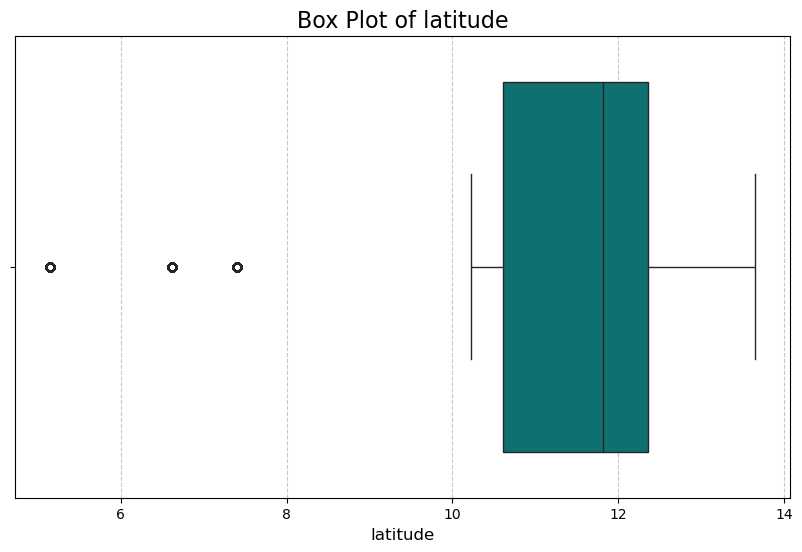

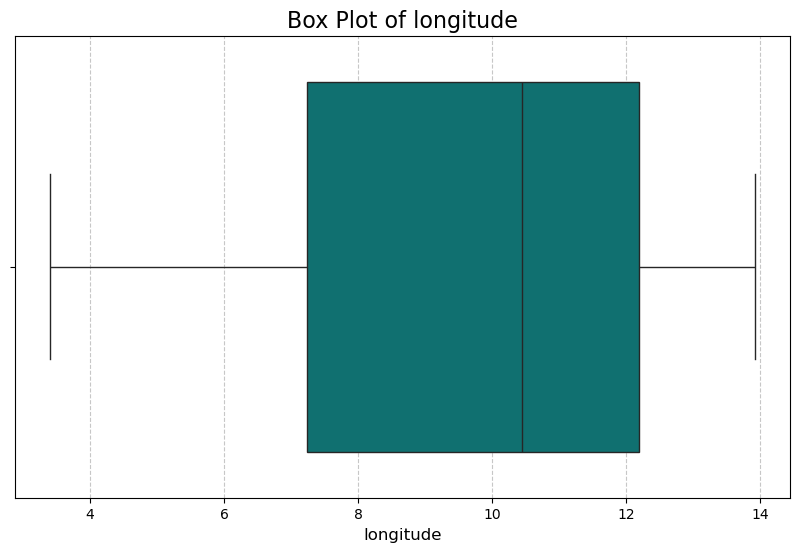

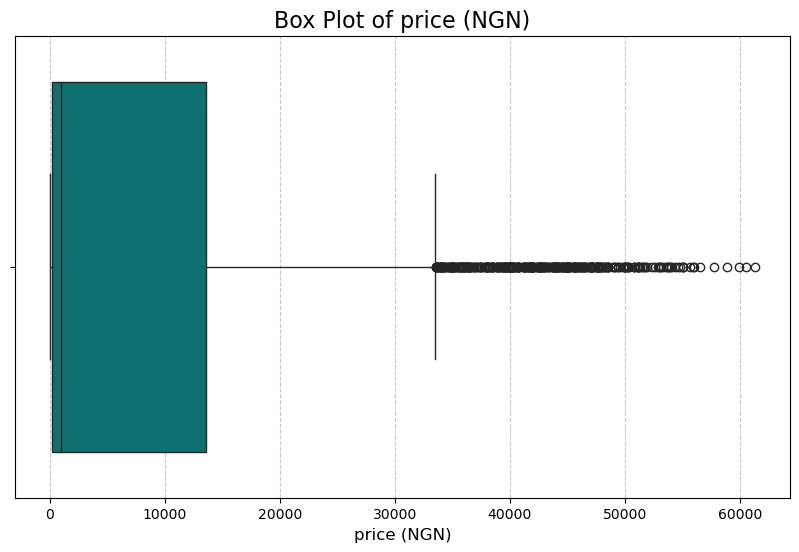

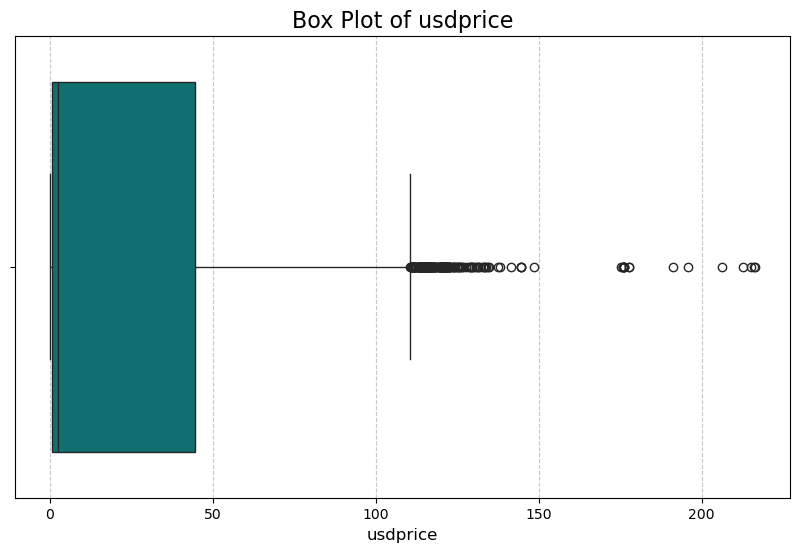

In [26]:
# Convert numeric columns (if necessary)
numeric_columns = df_filtered.select_dtypes(include=['float64', 'int64']).columns

# Create box plots for all numeric columns
for column in numeric_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df_filtered[column], color='teal')
    
    # Customize the plot
    plt.title(f'Box Plot of {column}', fontsize=16)
    plt.xlabel(column, fontsize=12)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    
    # Show the plot
    plt.show()


In [31]:
import plotly.express as px

# Create a time series plot using Plotly
fig = px.line(
    df_filtered, 
    x='Date', 
    y='price (NGN)', 
    title='Time Series Plot of Cereal Prices',
    labels={'price (NGN)': 'Price (NGN)', 'Date': 'Date'},
    markers=True  # Add markers to make data points visible
)

# Customize layout for better readability
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Price (NGN)',
    template='plotly_white',
    hovermode='x unified'
)

# Show the plot
fig.show()


In [29]:
# Convert the 'Date' column to datetime format
df_filtered['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')

# Verify the changes
df_filtered['Date'].head()

C:\Users\USER\AppData\Local\Temp\ipykernel_3792\3466062602.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



1   2002-01-15
2   2002-01-15
3   2002-01-15
5   2002-01-15
6   2002-01-15
Name: Date, dtype: datetime64[ns]

In [33]:
import plotly.express as px

# Create a time series plot using Plotly
fig = px.line(
    df_filtered, 
    x='Date', 
    y='usdprice', 
    title='Time Series Plot of Cereal Prices',
    labels={'price (USD)': 'Price (USD)', 'Date': 'Date'},
    markers=True  # Add markers to make data points visible
)

# Customize layout for better readability
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Price (USD)',
    template='plotly_white',
    hovermode='x unified'
)

# Show the plot
fig.show()


In [34]:
# Define a function to calculate and identify outliers using IQR
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)  # First quartile (25th percentile)
    Q3 = data[column].quantile(0.75)  # Third quartile (75th percentile)
    IQR = Q3 - Q1  # Interquartile Range
    
    lower_bound = Q1 - 1.5 * IQR  # Lower bound
    upper_bound = Q3 + 1.5 * IQR  # Upper bound
    
    # Identify outliers
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    
    return lower_bound, upper_bound, outliers

# Apply the function to the 'price (NGN)' column
lower_bound, upper_bound, outliers = detect_outliers_iqr(df_filtered, 'price (NGN)')

# Print the results
print(f"Lower Bound: {lower_bound}")
print(f"Upper Bound: {upper_bound}")
print(f"Number of Outliers: {len(outliers)}")
print(outliers)


Lower Bound: -19720.5
Upper Bound: 33507.5
Number of Outliers: 419
            Date    State           LGA Local Market Name   latitude  \
1964  2014-07-15    Lagos        Kosofe             Lagos   6.612164   
2116  2014-08-15    Lagos        Kosofe             Lagos   6.612164   
2262  2014-09-15    Lagos        Kosofe             Lagos   6.612164   
2423  2014-10-15    Lagos        Kosofe             Lagos   6.612164   
2691  2014-12-15    Lagos        Kosofe             Lagos   6.612164   
...          ...      ...           ...               ...        ...   
46438 2023-01-15    Lagos        Kosofe             Lagos   6.612164   
46460 2023-01-15      Oyo  Ibadan North            Ibadan   7.401960   
46479 2023-01-15     Yobe      Damaturu          Damaturu  11.744440   
46518 2023-01-15  Zamfara  Kaura Namoda      Kaura Namoda  12.595190   
46520 2023-01-15  Zamfara  Kaura Namoda      Kaura Namoda  12.595190   

       longitude            category   commodity name    unit  price

In [35]:
# Define a function to calculate and identify outliers using IQR
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)  # First quartile (25th percentile)
    Q3 = data[column].quantile(0.75)  # Third quartile (75th percentile)
    IQR = Q3 - Q1  # Interquartile Range
    
    lower_bound = Q1 - 1.5 * IQR  # Lower bound
    upper_bound = Q3 + 1.5 * IQR  # Upper bound
    
    # Identify outliers
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    
    return lower_bound, upper_bound, outliers

# Apply the function to the 'price (NGN)' column
lower_bound, upper_bound, outliers = detect_outliers_iqr(df_filtered, 'usdprice')

# Print the results
print(f"Lower Bound: {lower_bound}")
print(f"Upper Bound: {upper_bound}")
print(f"Number of Outliers: {len(outliers)}")
print(outliers)

Lower Bound: -65.1116875
Upper Bound: 110.6542125
Number of Outliers: 195
            Date    State           LGA Local Market Name   latitude  \
1627  2013-10-15    Borno     Maiduguri         Maiduguri  11.831100   
1643  2013-11-15    Borno     Maiduguri         Maiduguri  11.831100   
1964  2014-07-15    Lagos        Kosofe             Lagos   6.612164   
2116  2014-08-15    Lagos        Kosofe             Lagos   6.612164   
2262  2014-09-15    Lagos        Kosofe             Lagos   6.612164   
...          ...      ...           ...               ...        ...   
46343 2023-01-15   Kaduna          Giwa              Giwa  11.280160   
46380 2023-01-15     Kano  Dawakin Tofa           Dawanau  12.090120   
46398 2023-01-15  Katsina       Dandume           Dandume  11.416670   
46479 2023-01-15     Yobe      Damaturu          Damaturu  11.744440   
46520 2023-01-15  Zamfara  Kaura Namoda      Kaura Namoda  12.595190   

       longitude            category        commodity name   